# **DEPENDENCIES**

In [42]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.metrics.pairwise import pairwise_kernels
from tqdm import tqdm


# **DATASET**

In [4]:
# MNIST dataset: 50 images per class 
# Load MNIST from keras
(Xtr, Ytr), (Xte, Yte) = tf.keras.datasets.mnist.load_data()

# **MODELS**
### Kernal Matrix 
- Linear Kernel
- Polynomial Kernel with degree 2, 3 and 5
- RBF kernel with sigma=0.5, 1, and 2

In [55]:
def plot_kernel_matrix(model, Xtr, Xte):
    kmtr = pairwise_kernels(Xtr, Xtr, metric=model.kernel, filter_params=True)
    # normalize kernel matrix
    kmtr = (kmtr - kmtr.min())/(kmtr.max() - kmtr.min())
    kmte = pairwise_kernels(Xte, Xte, metric=model.kernel, filter_params=True)
    # normalize kernel matrix
    kmte = (kmte - kmte.min())/(kmte.max() - kmte.min())
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(kmtr)
    ax[0].set_title('Train kernel matrix')
    ax[1].imshow(kmte)
    ax[1].set_title('Test kernel matrix')
    plt.suptitle(f"kernel: {model.kernel}")
    plt.show()

    

In [34]:
Xtr1000 = Xtr[:1000]
Ytr1000 = Ytr[:1000]
Xte1000 = Xte[:1000]
Yte1000 = Yte[:1000]

Vectorization (flattened vector) of the image data as feature

In [39]:
Xtrv = Xtr1000.flatten().reshape(1000, 784)
Xtev = Xte1000.flatten().reshape(1000, 784)

Histogram of instensity values of the image data as feature

In [38]:
histograms = []
for sample in Xtr1000:
    histogram, _ = np.histogram(sample, bins=256, range=(0, 255))  # 256 bins for 8-bit intensity values
    histograms.append(histogram)
Xtri = np.array(histograms)

histograms = []
for sample in Xte1000:
    histogram, _ = np.histogram(sample, bins=256, range=(0, 255))  # 256 bins for 8-bit intensity values
    histograms.append(histogram)
Xtei = np.array(histograms)

HLBP

In [37]:
def compute_lbp(images, radius=1, npoints=8, axis=0):
    if axis not in [0, 1]:
        raise ValueError(
            "Axis must be 0 or 1 for row-wise or column-wise processing."
        )

    num_images, height, width = images.shape
    lbp_images = np.zeros(images.shape, dtype=np.uint8)

    angles = np.linspace(0, 2 * np.pi, npoints, endpoint=False)
    x_offsets = np.round(radius * np.cos(angles)).astype(int)
    y_offsets = np.round(radius * np.sin(angles)).astype(int)

    for i in range(radius, height - radius):
        for j in range(radius, width - radius):
            center = images[:, i, j] if axis == 0 else images[i, j, :]
            pattern = np.zeros(num_images, dtype=np.uint8)
            for x_offset, y_offset in zip(x_offsets, y_offsets):
                x = i + x_offset
                y = j + y_offset
                neighbor = images[:, x, y] if axis == 0 else images[x, y, :]
                pattern = (pattern << 1) | (neighbor >= center)
            lbp_images[:, i, j] = pattern

    return lbp_images

def compute_hist(images):
    images = images.reshape(images.shape[0], -1)
    bins = np.arange(-0.5, 255.5, 1)
    hist = np.apply_along_axis(
        lambda x: np.histogram(x, bins=bins)[0], 1, images
    ).astype('float')
    hist /= np.linalg.norm(hist, axis=1, keepdims=True) + 1e-8
    return hist

In [40]:
Xtrl = compute_lbp(Xtr1000)
Xtel = compute_lbp(Xte1000)
Xtrl = compute_hist(Xtrl)
Xtel = compute_hist(Xtel)

HOG

In [45]:
def convolution2d(image, kernel):
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape
    output_height = image_height - kernel_height + 1
    output_width = image_width - kernel_width + 1
    output = np.zeros((output_height, output_width))
    for i in range(output_height):
        for j in range(output_width):
            output[i, j] = np.sum(
                image[i : i + kernel_height, j : j + kernel_width] * kernel
            )
    return output


def compute_oriented_gradients(image_array):
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    
    num_images = len(image_array)
    gradient_magnitudes = np.zeros(
        (num_images, image_array.shape[1] - 2, image_array.shape[2] - 2)
    )
    gradient_orientations = np.zeros(
        (num_images, image_array.shape[1] - 2, image_array.shape[2] - 2)
    )

    for i, image in tqdm(enumerate(image_array), total=num_images):
        gradient_x = convolution2d(image, sobel_x)
        gradient_y = convolution2d(image, sobel_y)
        gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
        gradient_orientation = np.arctan2(gradient_y, gradient_x)
        
        gradient_magnitudes[i] = gradient_magnitude
        gradient_orientations[i] = gradient_orientation

    return np.array(gradient_magnitudes), np.array(gradient_orientations)

def compute_hog(image_array, cell_size=(4, 4), block_size=(2, 2), bins=3):
    gradient_magnitudes, gradient_orientations = compute_oriented_gradients(image_array)
    hog_features = []

    for gradient_magnitude, gradient_orientation in tqdm(zip(
        gradient_magnitudes, gradient_orientations)
    ):
        num_cells_x = gradient_magnitude.shape[1] // cell_size[1]
        num_cells_y = gradient_magnitude.shape[0] // cell_size[0]
        histograms = np.zeros((num_cells_y, num_cells_x, bins))
        block_features = np.zeros(
            (
                num_cells_y - block_size[0] + 1,
                num_cells_x - block_size[1] + 1,
                block_size[0],
                block_size[1],
                bins,
            )
        )

        for y in range(num_cells_y):
            for x in range(num_cells_x):
                cell_magnitude = gradient_magnitude[
                    y * cell_size[0] : (y + 1) * cell_size[0],
                    x * cell_size[1] : (x + 1) * cell_size[1],
                ]
                cell_orientation = gradient_orientation[
                    y * cell_size[0] : (y + 1) * cell_size[0],
                    x * cell_size[1] : (x + 1) * cell_size[1],
                ]
                histograms[y, x], _ = np.histogram(
                    cell_orientation,
                    bins=np.linspace(0, 2 * np.pi, bins + 1),
                    weights=cell_magnitude,
                )
        for y in range(num_cells_y - block_size[0] + 1):
            for x in range(num_cells_x - block_size[1] + 1):
                block = histograms[y : y + block_size[0], x : x + block_size[1]]
                block_features[y, x] = block
        block_features = block_features / np.sqrt(np.sum(block_features**2) + 1e-6)

        hog_features.append(block_features.flatten())
    return np.array(hog_features)

In [46]:
Xtrh = compute_hog(Xtr1000)
Xteh = compute_hog(Xte1000)

100%|██████████| 1000/1000 [00:10<00:00, 94.53it/s]
1000it [00:02, 333.97it/s]
100%|██████████| 1000/1000 [00:11<00:00, 86.87it/s]
1000it [00:05, 189.93it/s]


# **TRAIN-LOOP**

Dataset: Xtrv
Kernel: linear
Train accuracy: 1.0000
Test accuracy: 0.8530


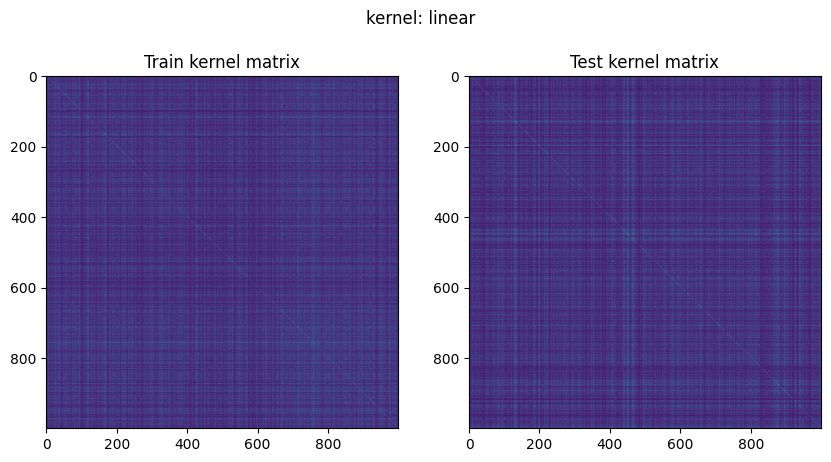

Kernel: poly
Train accuracy: 0.9760
Test accuracy: 0.8710
Specific parameter value(s): [2, 3, 5]


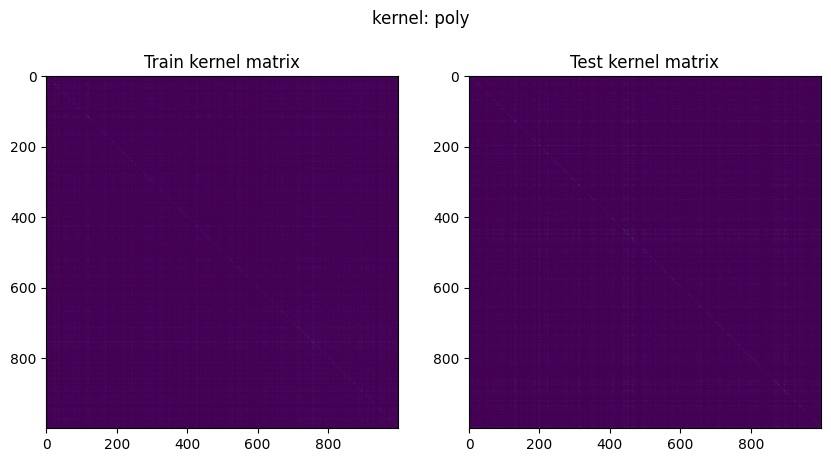

Kernel: poly
Train accuracy: 0.9650
Test accuracy: 0.8160
Specific parameter value(s): None


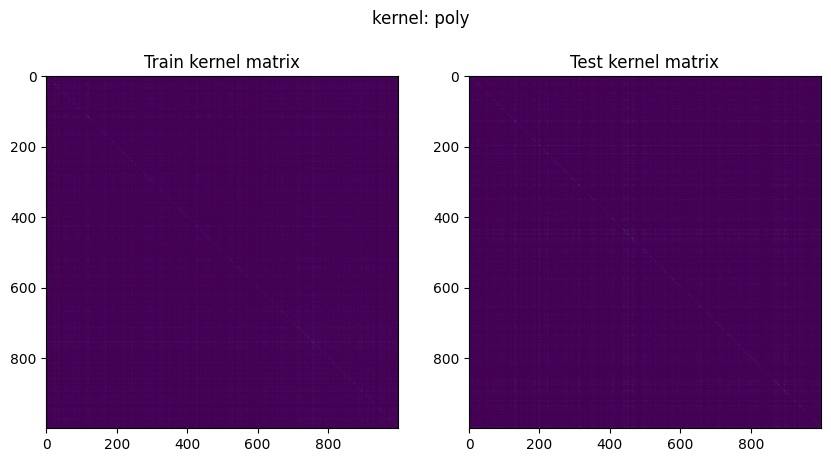

Kernel: poly
Train accuracy: 0.9650
Test accuracy: 0.8160
Specific parameter value(s): None


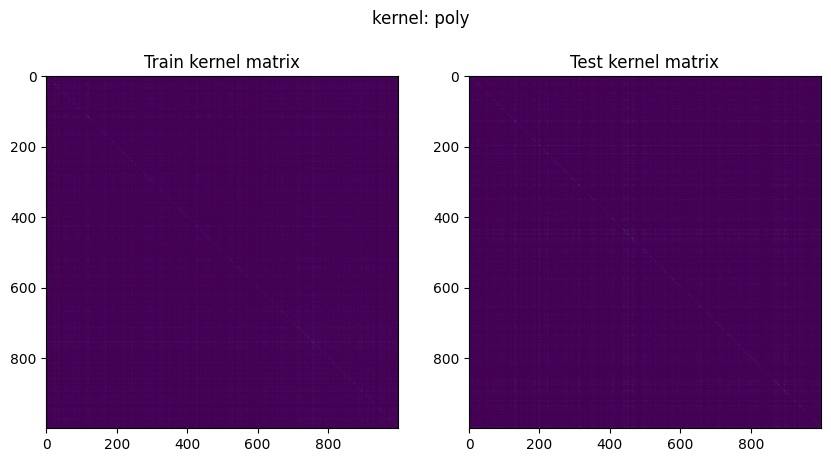

Kernel: rbf
Train accuracy: 1.0000
Test accuracy: 0.0990
Specific parameter value(s): [0.5, 1, 2]


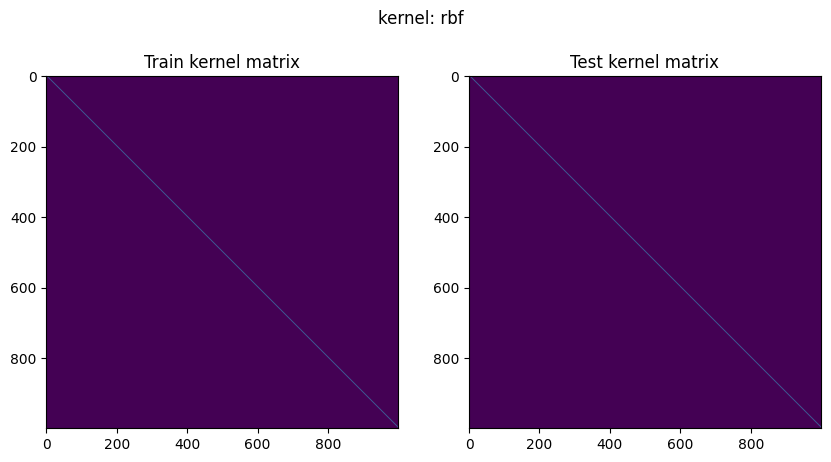

Kernel: rbf
Train accuracy: 0.9820
Test accuracy: 0.8750
Specific parameter value(s): None


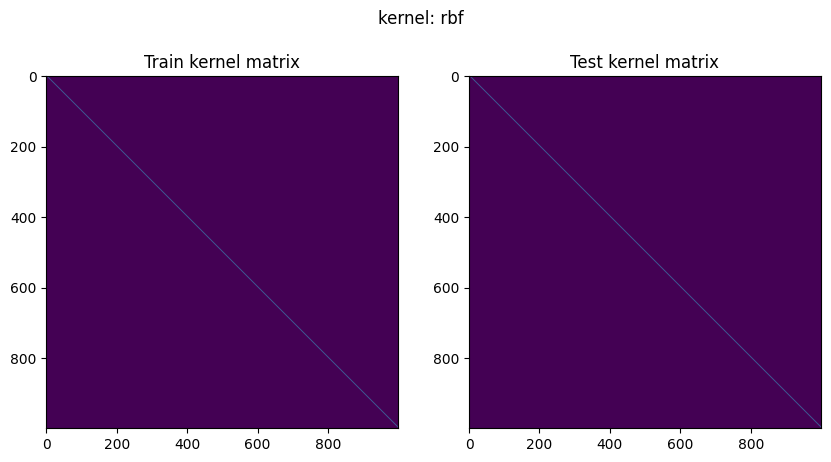

Kernel: rbf
Train accuracy: 0.9820
Test accuracy: 0.8750
Specific parameter value(s): None


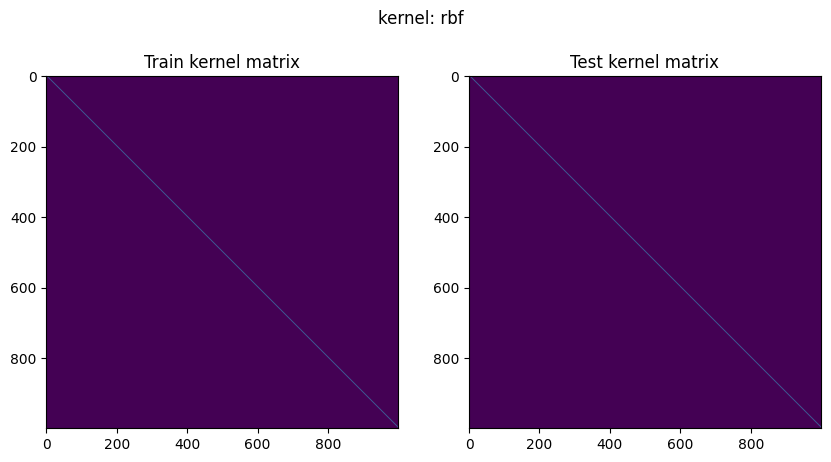

--------------------------------------------
Dataset: Xtri
Kernel: linear
Train accuracy: 0.9950
Test accuracy: 0.2670


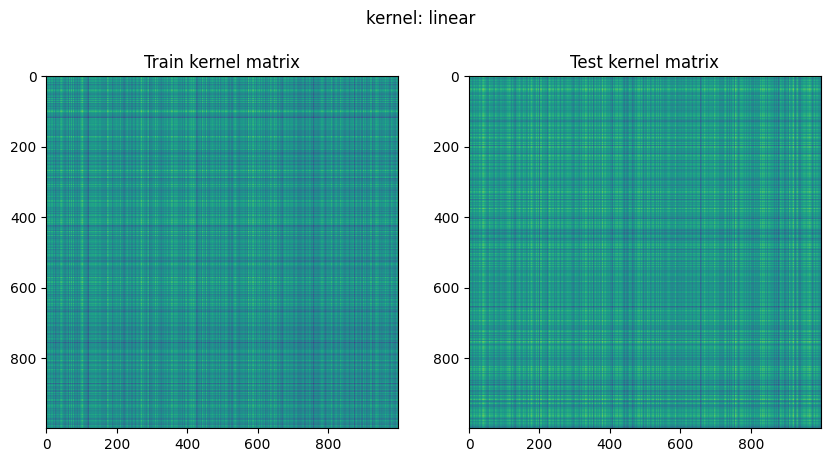

Kernel: poly
Train accuracy: 0.2630
Test accuracy: 0.2260
Specific parameter value(s): [2, 3, 5]


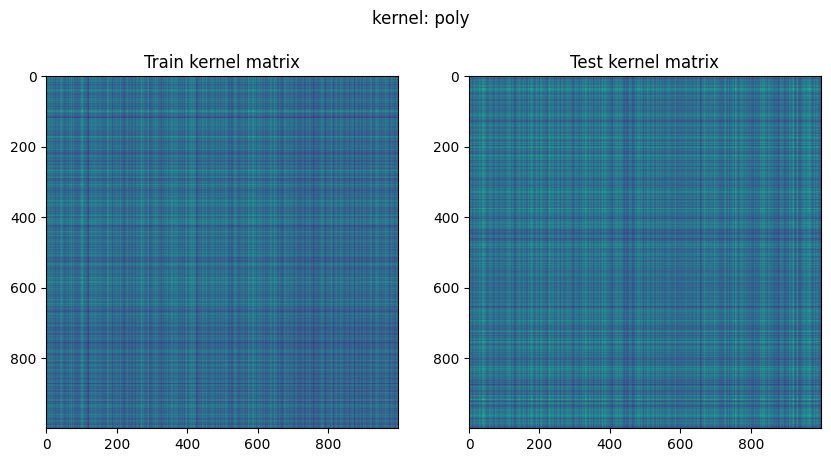

Kernel: poly
Train accuracy: 0.2690
Test accuracy: 0.2380
Specific parameter value(s): None


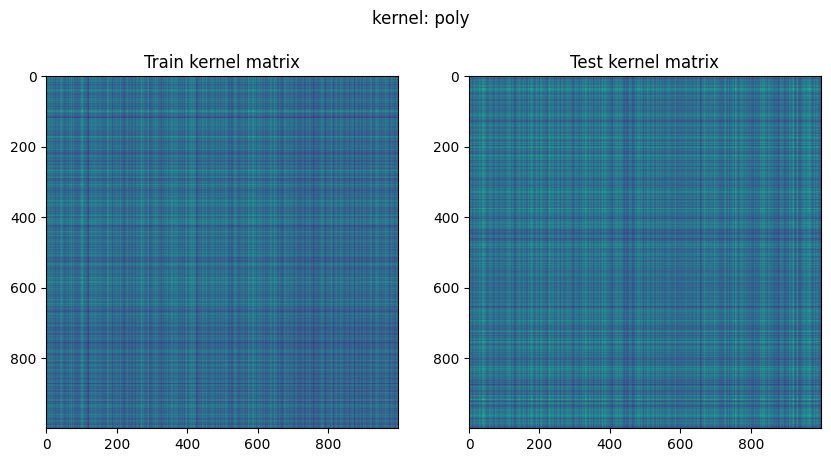

Kernel: poly
Train accuracy: 0.2690
Test accuracy: 0.2380
Specific parameter value(s): None


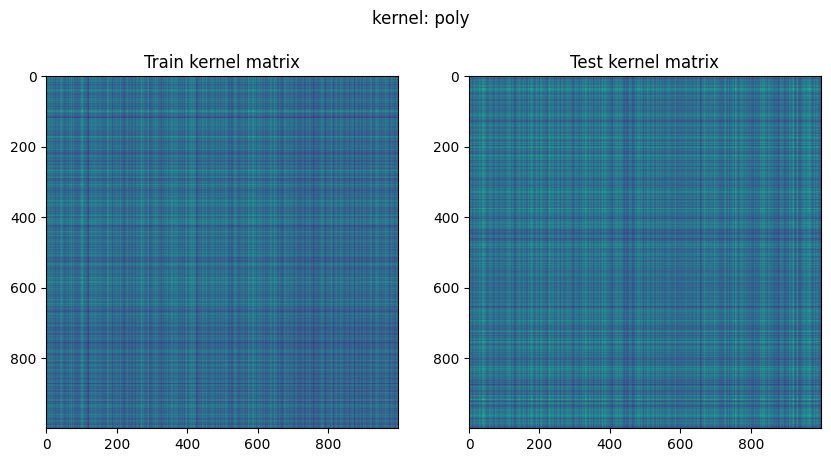

Kernel: rbf
Train accuracy: 1.0000
Test accuracy: 0.0990
Specific parameter value(s): [0.5, 1, 2]


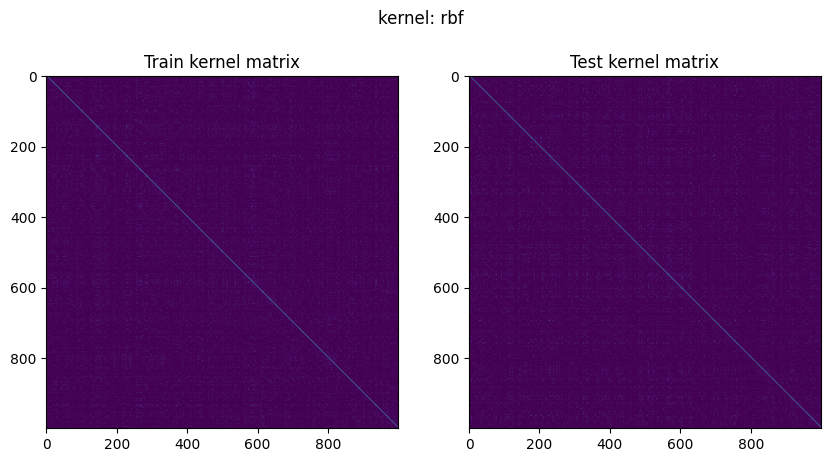

Kernel: rbf
Train accuracy: 0.2570
Test accuracy: 0.2210
Specific parameter value(s): None


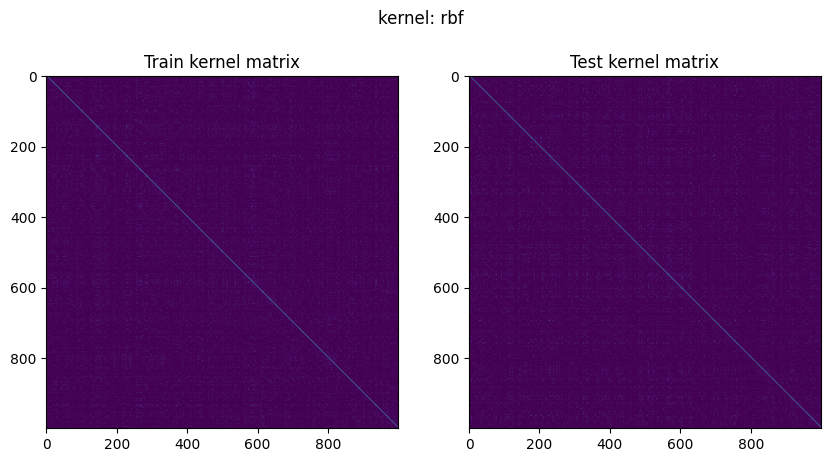

Kernel: rbf
Train accuracy: 0.2570
Test accuracy: 0.2210
Specific parameter value(s): None


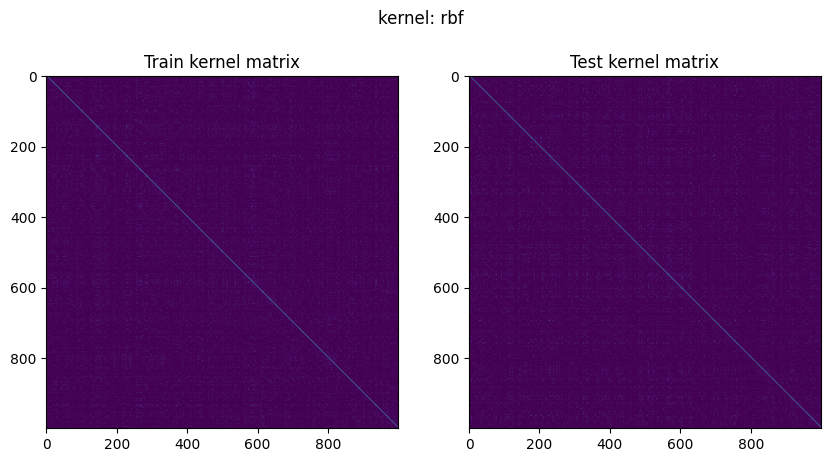

--------------------------------------------
Dataset: Xtrl
Kernel: linear
Train accuracy: 0.3270
Test accuracy: 0.2850


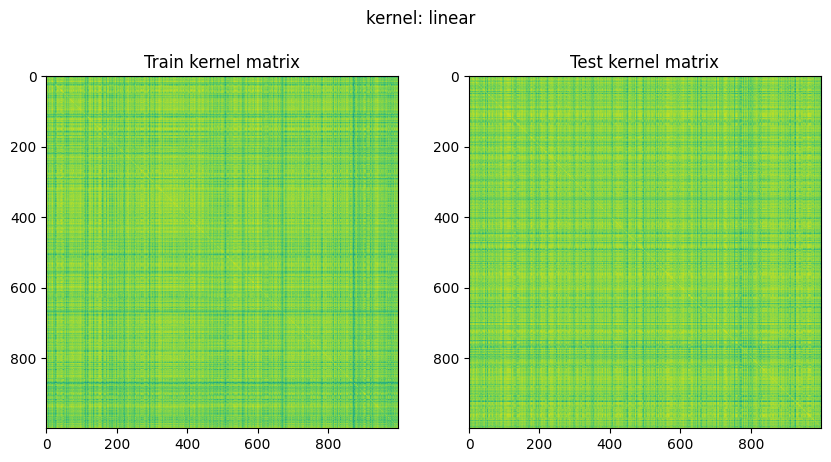

Kernel: poly
Train accuracy: 0.4800
Test accuracy: 0.3870
Specific parameter value(s): [2, 3, 5]


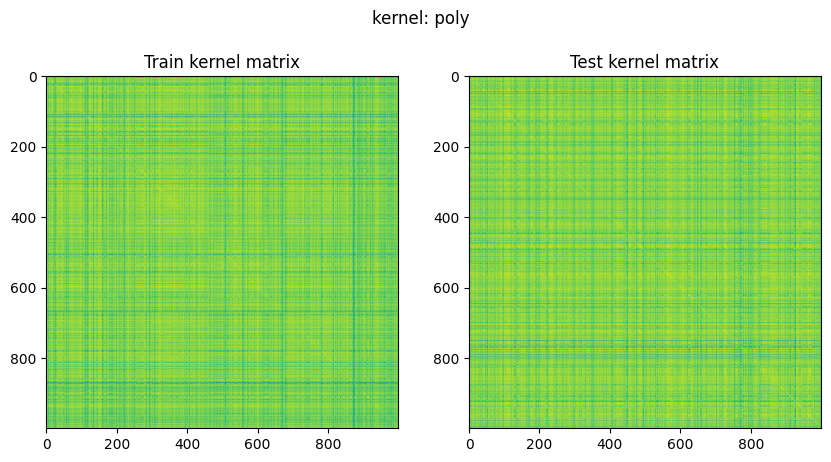

Kernel: poly
Train accuracy: 0.5960
Test accuracy: 0.4390
Specific parameter value(s): None


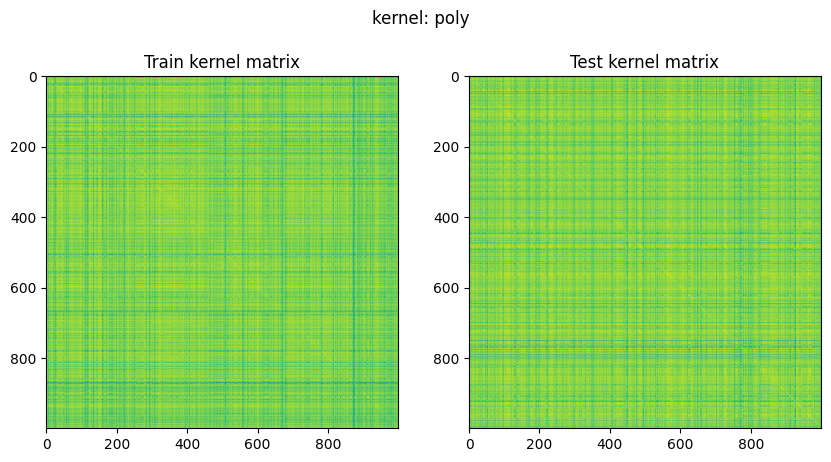

Kernel: poly
Train accuracy: 0.5960
Test accuracy: 0.4390
Specific parameter value(s): None


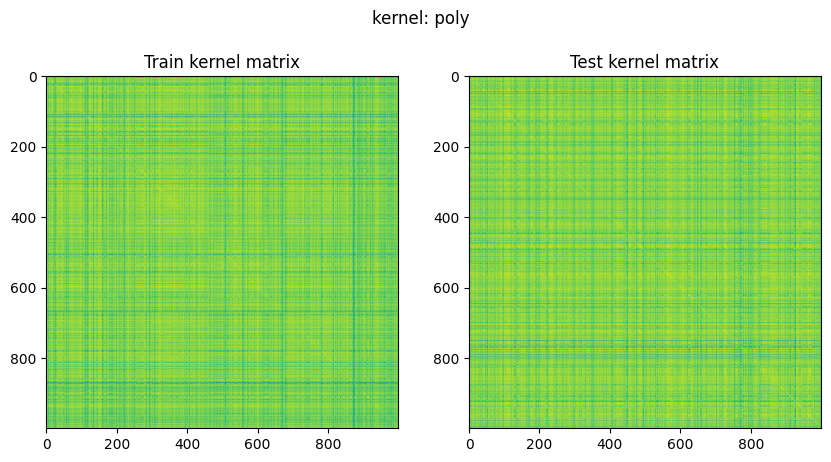

Kernel: rbf
Train accuracy: 0.6270
Test accuracy: 0.4560
Specific parameter value(s): [0.5, 1, 2]


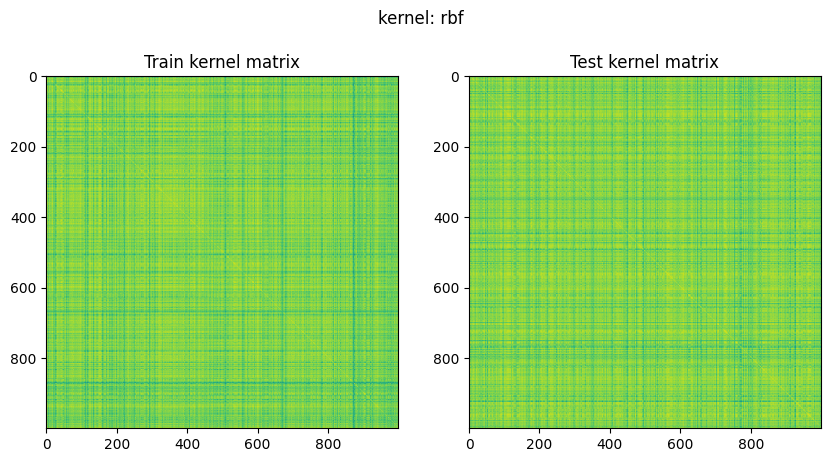

Kernel: rbf
Train accuracy: 0.4740
Test accuracy: 0.3800
Specific parameter value(s): None


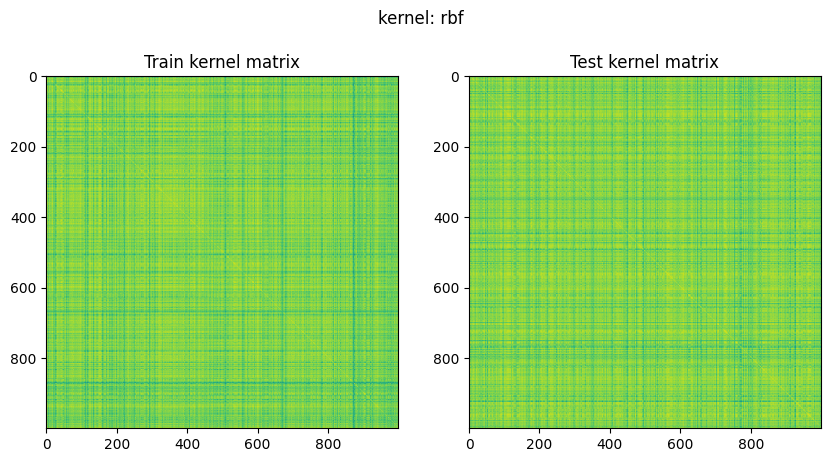

Kernel: rbf
Train accuracy: 0.4740
Test accuracy: 0.3800
Specific parameter value(s): None


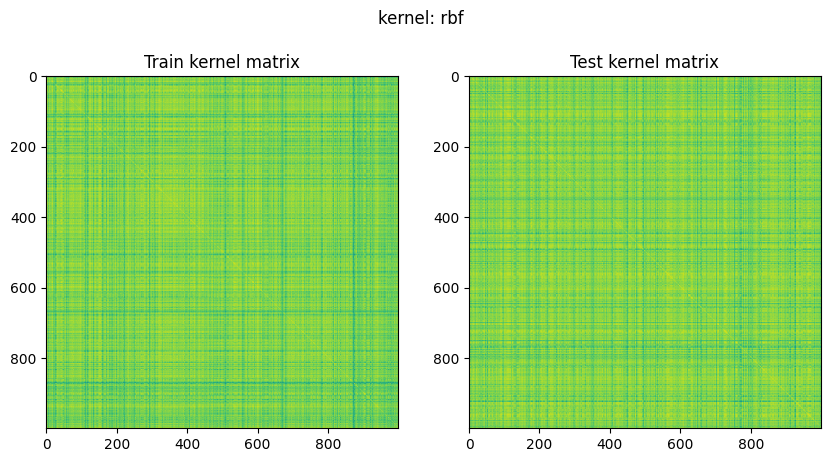

--------------------------------------------
Dataset: Xtrh
Kernel: linear
Train accuracy: 0.9090
Test accuracy: 0.8540


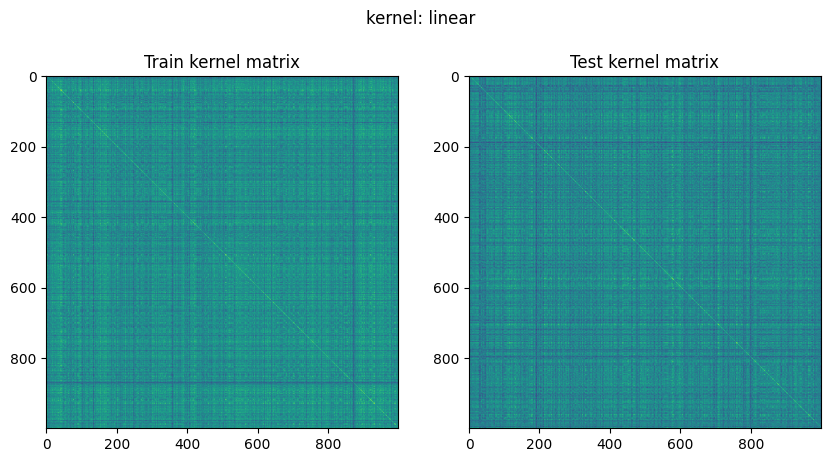

Kernel: poly
Train accuracy: 0.9660
Test accuracy: 0.8990
Specific parameter value(s): [2, 3, 5]


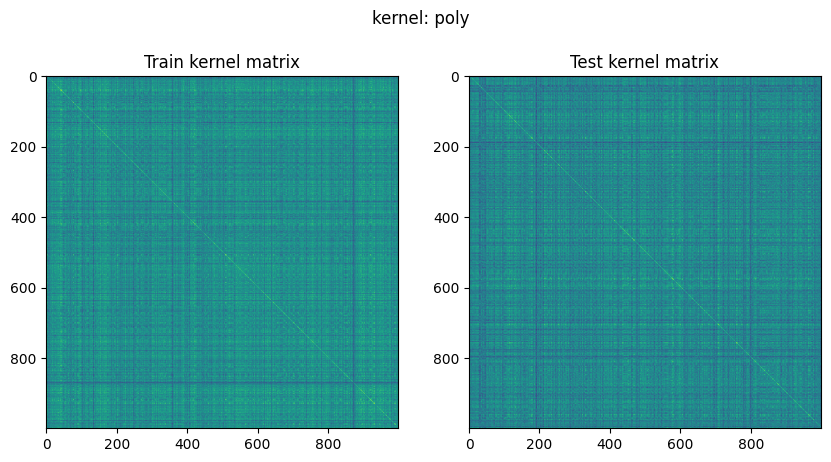

Kernel: poly
Train accuracy: 0.9870
Test accuracy: 0.9090
Specific parameter value(s): None


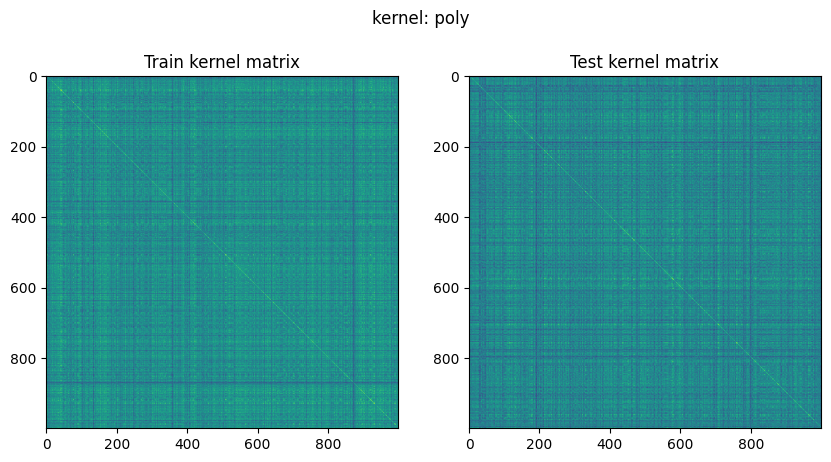

Kernel: poly
Train accuracy: 0.9870
Test accuracy: 0.9090
Specific parameter value(s): None


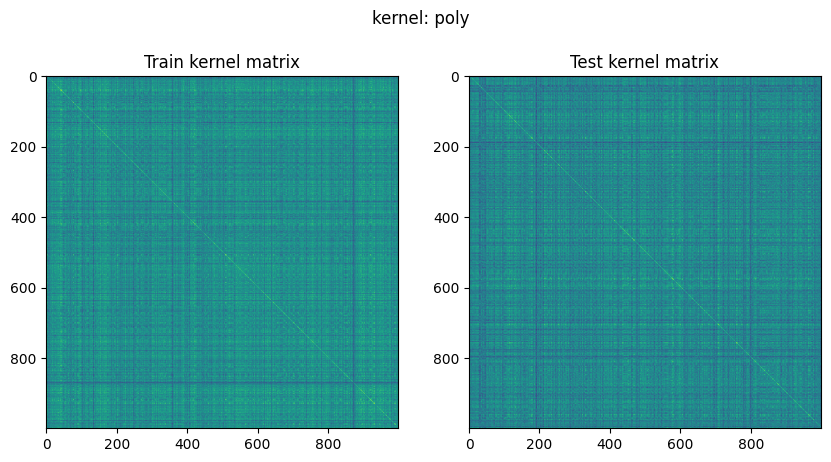

Kernel: rbf
Train accuracy: 0.9820
Test accuracy: 0.9050
Specific parameter value(s): [0.5, 1, 2]


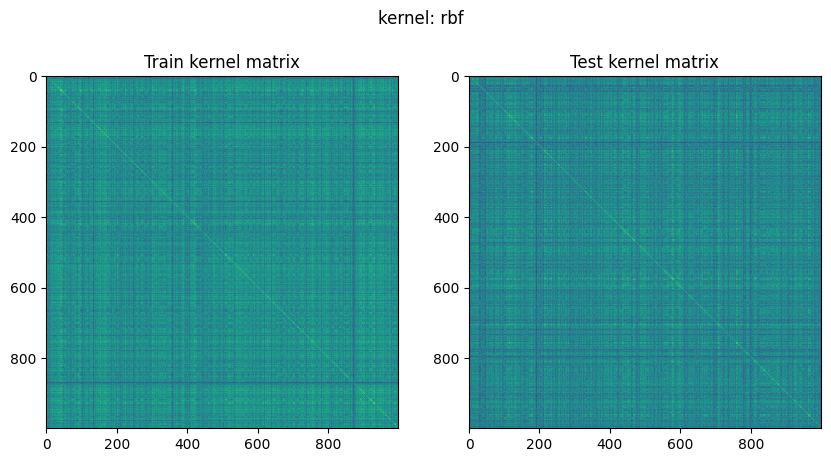

Kernel: rbf
Train accuracy: 0.9610
Test accuracy: 0.8940
Specific parameter value(s): None


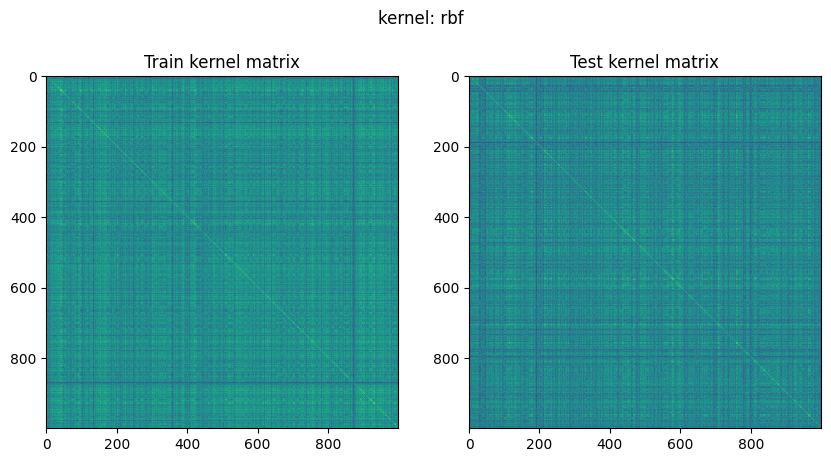

Kernel: rbf
Train accuracy: 0.9610
Test accuracy: 0.8940
Specific parameter value(s): None


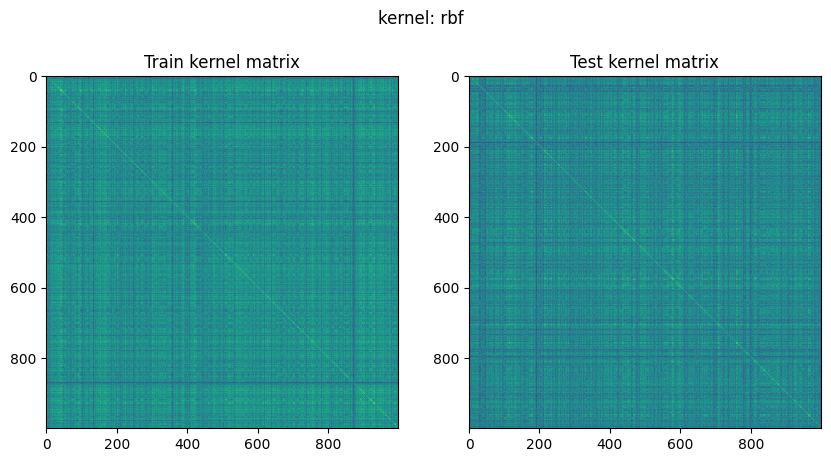

--------------------------------------------


In [56]:
# Define your data subsets and their corresponding test data
data_subsets = [Xtrv, Xtri, Xtrl, Xtrh]
test_data = [Xtev, Xtei, Xtel, Xteh]
dataset_names = ['Xtrv', 'Xtri', 'Xtrl', 'Xtrh']

# Define the kernel types and their respective hyperparameters
kernels = ['linear', 'poly', 'poly', 'poly', 'rbf', 'rbf', 'rbf']
kernel_hyperparams = [None, 2, 3, 5, 0.5, 1, 2]
specific_params = [None, [2, 3, 5], None, None, [0.5, 1, 2], None, None]

# Iterate through each dataset
for data_idx, (data, test_data, dataset_name) in enumerate(zip(data_subsets, test_data, dataset_names)):
    print(f'Dataset: {dataset_name}')
    
    # Iterate through each kernel type
    for kernel_idx, kernel in enumerate(kernels):
        print(f'Kernel: {kernel}')
        hyperparam = kernel_hyperparams[kernel_idx]
        specific_param_values = specific_params[kernel_idx]
        
        # Initialize the SVM classifier with the current kernel and hyperparameter
        if kernel == 'linear':
            svm_classifier = svm.SVC(kernel='linear', C=1.0)
        elif kernel == 'poly':
            if specific_param_values is not None:
                degree = specific_param_values[0]
                svm_classifier = svm.SVC(kernel='poly', degree=degree, C=1.0)
            else:
                svm_classifier = svm.SVC(kernel='poly', C=1.0)
        elif kernel == 'rbf':
            if specific_param_values is not None:
                sigma = specific_param_values[0]
                svm_classifier = svm.SVC(kernel='rbf', gamma=1.0 / (2.0 * sigma ** 2), C=1.0)
            else:
                svm_classifier = svm.SVC(kernel='rbf', C=1.0)
        
        # Train the SVM classifier
        svm_classifier.fit(data, Ytr1000)
        
        # Calculate and print the training accuracy
        train_accuracy = svm_classifier.score(data, Ytr1000)
        print(f'Train accuracy: {train_accuracy:.4f}')
        
        # Calculate and print the test accuracy
        test_accuracy = svm_classifier.score(test_data, Yte1000)
        print(f'Test accuracy: {test_accuracy:.4f}')

                
        # Print the specific hyperparameter value
        if hyperparam is not None:
            print(f'Specific parameter value(s): {specific_param_values}')

        # Plot the kernel matrix
        plot_kernel_matrix(svm_classifier, data, test_data)
    
    print('--------------------------------------------')